In [64]:
from collections import Counter
import datetime as dt
from pathlib import Path
from typing import List, Tuple
from urllib.request import urlretrieve

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pyproj import CRS, Transformer
import rasterio
from rasterio.plot import show
import requests


PROJECT_DIR = Path(".").resolve()
PROJECT_DATA_DIR = PROJECT_DIR.joinpath("data")
PROJECT_DATA_DIR.mkdir(exist_ok=True)

output_dir = PROJECT_DATA_DIR.joinpath("IL_NAIP_2021_9599")
output_dir.mkdir(exist_ok=True)




def convert_image_bounds_to_4326(image_crs: rasterio.crs.CRS, image_bounds: rasterio.coords.BoundingBox) -> Tuple:
    transformer = Transformer.from_crs(CRS(image_crs), CRS("epsg:4326"))
    left, top = transformer.transform(image_bounds.left, image_bounds.top)
    right, bottom = transformer.transform(image_bounds.right, image_bounds.bottom)
    print(f"Lat, Lon of the upper left corner:   {left, top}")
    print(f"Lat, Lon of the bottom right corner: {right, bottom}")
    return (left, bottom, right, top)


def download_img_file(img_urls: List[str], output_dir: Path = output_dir) -> None:
    for img_url in img_urls:
        file_name = img_url.split("/")[-1]
        file_path = output_dir.joinpath(file_name)
        if not file_path.is_file():
            print(f"File {file_name} doesn't exist; downloading now")
            urlretrieve(img_url, file_path)
        else:
            print(f"File {file_name} already downloaded. Skipping redownload.")


In [2]:
il_2021_img_urls_url = "https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/urllist_2021_4BandImagery_Illinois_m9599.txt"
resp = requests.get(il_2021_img_urls_url)
if resp.status_code == 200:
    il_2021_img_urls = resp.text.split("\n")

In [3]:
il_2021_img_urls[0:5]

['https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_15.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_16.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/m_3608906_ne_16_060_20210622.tif',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/m_3608907_ne_16_060_20210617.tif',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/m_3608907_nw_16_060_20210617.tif']

In [4]:
print(f'.tif file urls:  {len([x for x in il_2021_img_urls if x.endswith(".tif")])}')
print(f"Total file urls: {len(il_2021_img_urls)}")
Counter([x.split(".")[-1] for x in il_2021_img_urls])

.tif file urls:  4131
Total file urls: 8285


Counter({'vrt': 2,
         'tif': 4131,
         'xml': 4149,
         'zip': 1,
         'gov/inport/item/68085': 1,
         '': 1})

In [5]:
[el for el in il_2021_img_urls if all(not el.endswith(ext) for ext in [".tif", ".xml"])]

['https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_15.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_16.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/tile_index_IL_NAIP_2021_9599.zip',
 'https://www.fisheries.noaa.gov/inport/item/68085',
 '']

`.vrt` files are Virtual Format files used by GDAL (the Geospatial Data Abstraction Library). I haven't looked at one before, and this full Illinois aerial imagery dataset is ~75GB, so let's take a look and see if we can't determine some pattern to the `.tif` filenaming that would enable me to avoid a massive download. And if the `.vrt` files aren't useful, I guess I can explore those ... 4149 `.xml` files for meaning.

In [16]:
[img_url for img_url in il_2021_img_urls if img_url.endswith(".tif")][0]
# [0]

'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/m_3608906_ne_16_060_20210622.tif'

In [51]:
dl_urls = [img_url for img_url in il_2021_img_urls if img_url.endswith(".tif")][0:3]
dl_file_names = [url.split("/")[-1] for url in dl_urls]
download_img_file(img_urls=dl_urls)

File m_3608906_ne_16_060_20210622.tif already downloaded. Skipping redownload.
File m_3608907_ne_16_060_20210617.tif already downloaded. Skipping redownload.
File m_3608907_nw_16_060_20210617.tif already downloaded. Skipping redownload.


In [52]:
!ls -lshtr {output_dir} | head -n 6

total 27G
1.6M -rw-rw-r-- 1 matt matt 1.6M Jul  1 20:31 il_naip_2021_15.vrt
5.1M -rw-rw-r-- 1 matt matt 5.1M Jul  1 20:31 il_naip_2021_16.vrt
454M -rw-rw-r-- 1 matt matt 454M Jul  1 20:31 m_3608906_ne_16_060_20210622.tif
431M -rw-rw-r-- 1 matt matt 431M Jul  1 20:31 m_3608907_ne_16_060_20210617.tif
422M -rw-rw-r-- 1 matt matt 422M Jul  1 20:31 m_3608907_nw_16_060_20210617.tif


Oof.mp3, ~450MB per `.tif` (based on looking at the first 3), and there are 4131 `.tif` files. I guess before I try to figure out the naming structure, I should see if the image data is adequate to resolve buildings.

### Question 1: Is the image resolution fine enough that we can resolve buildings?

In [58]:
file_path = output_dir.joinpath(dl_file_names[2])
with rasterio.open(file_path) as src:
    orig_crs = src.crs
    orig_bounds = src.bounds
    bands = src.read()
    print(f"File name: {file_path.name}")
    print(f"Transforms: {src.transform}")
    print(f"CRS:        {orig_crs}")
    print(f"Resolution: {src.res}")
    print(f"units:      {src.crs.linear_units}")
    print(f"bounds:     {orig_bounds}")
    print(f"indexes:    {src.indexes}")
    print(f"# of bands: {src.count}")
    print(f"Shape of imagery array: {bands.shape}")
    _ = convert_image_bounds_to_4326(image_crs=orig_crs, image_bounds=orig_bounds)

File name: m_3608907_nw_16_060_20210617.tif
Transforms: | 0.60, 0.00, 299327.40|
| 0.00,-0.60, 4097538.60|
| 0.00, 0.00, 1.00|
CRS:        EPSG:26916
Resolution: (0.6, 0.6)
units:      metre
bounds:     BoundingBox(left=299327.4, bottom=4089928.2, right=305696.4, top=4097538.6)
indexes:    (1, 2, 3, 4)
# of bands: 4
Shape of imagery array: (4, 12684, 10615)
Lat, Lon of the upper left corner:   (37.002598910956365, -89.25526907292884)
Lat, Lon of the bottom right corner: (36.93538410568418, -89.18177942773526)


From the above printout, we see:
* the rasters in this dataset use projected coordinate reference system (CRS) EPSG 26916,
* that projected CRS uses units of meters,
* one pixel represents a 0.6m x 0.6m area (i.e. the resolution is 0.6m x 0.6m), and
* the `bands` variable contains four stacked image arrays that are 12684 pixels by 10615 pixels

So each image should show a ~7.5 km by ~6.5 km area and have more than enough resolution to distinguish buildings from surrounding easments and infrastructure.

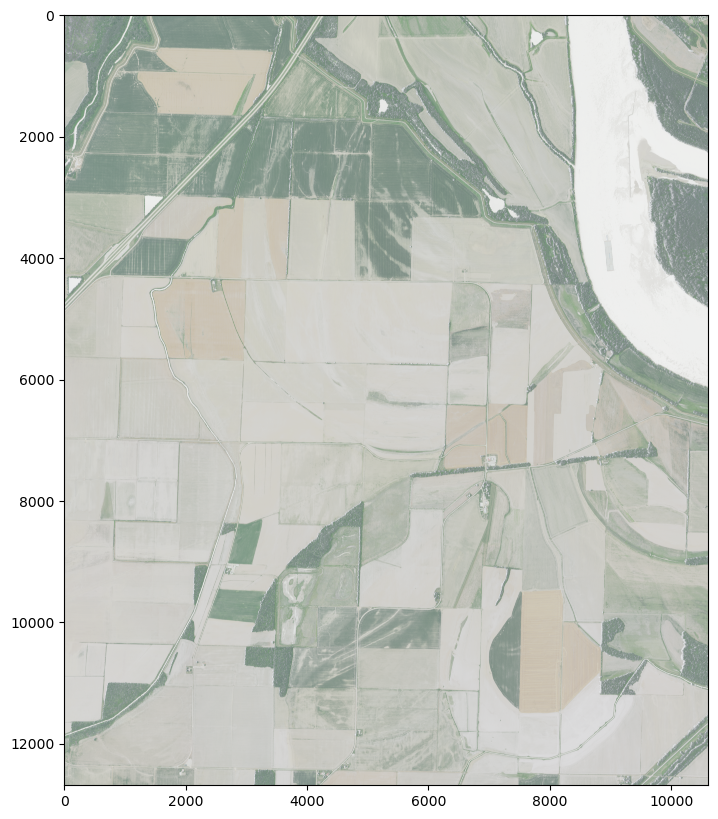

<AxesSubplot: >

In [62]:
plt.figure(figsize=(10,10))
show(bands)

That image is pretty faded. Let's look at the color-interpretation metadata and make prettier maps.

In [65]:
with rasterio.open(file_path) as src:
    print(src.colorinterp)

(<ColorInterp.red: 3>, <ColorInterp.green: 4>, <ColorInterp.blue: 5>, <ColorInterp.undefined: 0>)


Ok, so the 4 bands represent [red, green, blue, non-color-data]. Let's account for that.

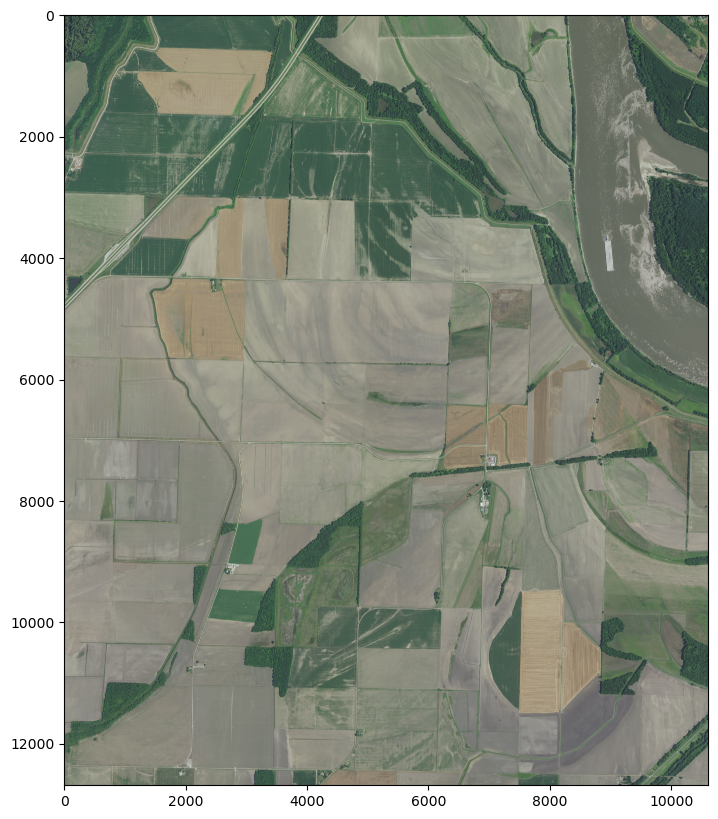

In [66]:
file_path=file_path
fig_width = 10

fig, ax = plt.subplots(figsize=(fig_width, fig_width))
with rasterio.open(file_path) as src:
    r = src.read(1)
    g = src.read(2)
    b = src.read(3)
    rgb = np.stack((r, g, b))
    show(rgb, ax=ax)

In [68]:


def download_tif_and_extract_bands(dl_filename: str, full_url_list: List = il_2021_img_urls, output_dir: Path = output_dir) -> np.ndarray:
    filename_subset = [el for el in full_url_list if el.endswith(dl_filename)]
    download_img_file(output_dir=output_dir, img_urls=filename_subset)
    file_path = output_dir.joinpath(dl_filename)

    with rasterio.open(file_path) as src:
        orig_crs = src.crs
        orig_bounds = src.bounds
        bands = src.read()
        print(f"File name:  {file_path.name}")
        print(f"bounds:     {orig_bounds}")
        print(f"indexes:    {src.indexes}")
        print(f"Shape of imagery array: {bands.shape}")
        _ = convert_image_bounds_to_4326(image_crs=orig_crs, image_bounds=orig_bounds)
    return bands

def plot_raster_image(file_path: Path, fig_width: int = 10) -> None:
    fig, ax = plt.subplots(figsize=(fig_width, fig_width))
    with rasterio.open(file_path) as src:
        r = src.read(1)
        g = src.read(2)
        b = src.read(3)
        rgb = np.stack((r, g, b))
        show(rgb, ax=ax)

We saw above that a pixel corresponds to about 0.6m of linear distance, so we should definately be able to see buildings, but let's blow up an image, for fun.

### Answer 1: Yes, we can easily resolve small buildings

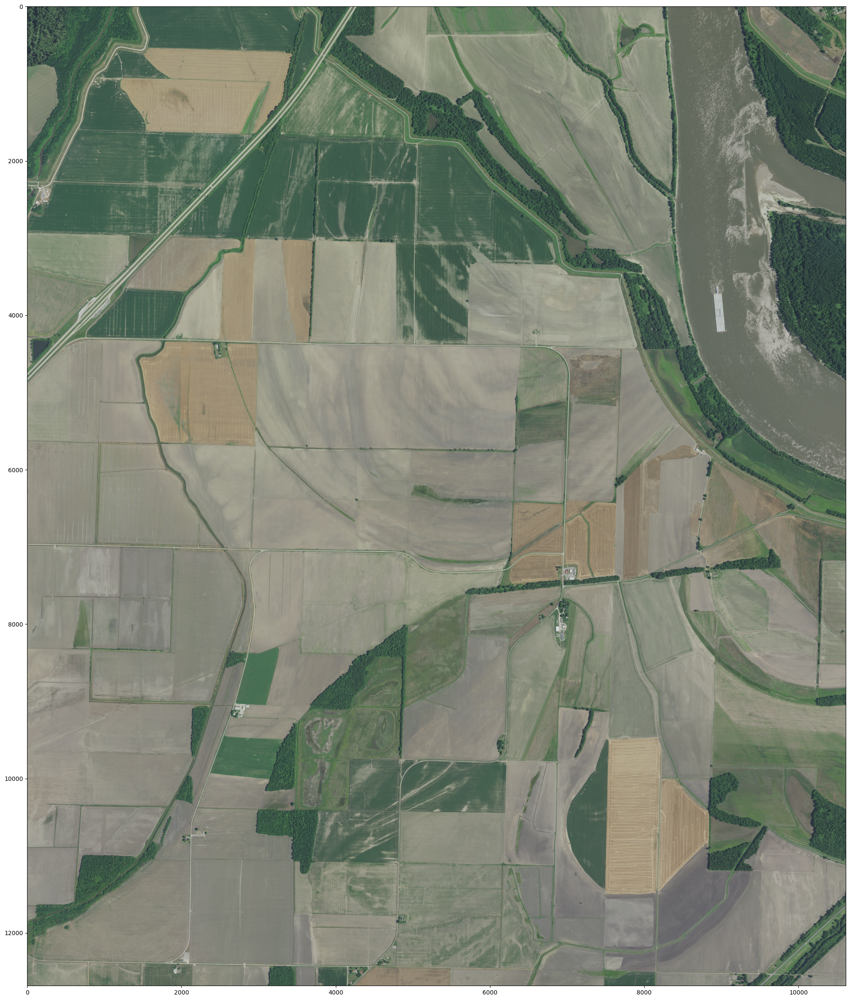

In [71]:
plot_raster_image(file_path=file_path, fig_width=30)

Now that we know that the data can support the research task, let's try to find images relevant to the research goal (namely, let's find images of Chicago). These `.tif` files are gigantic, so let's explore the metadata for order we can exploit to guide us. From the counts of file-extentions above, ~99.9% of the URLs in this dataset's manifest were either `.tif` or `.xml` files, and there were a few other URLs, two for `.vrt` files and one `.zip` file.

### Question 2: What does `.vrt` file data look like, and can I use it to determine the images covering Chicago

In [73]:
non_tif_or_xml_file_urls = [
    el for el in il_2021_img_urls if all(not el.endswith(ext) for ext in [".tif", ".xml"])
]
non_tif_or_xml_file_urls

['https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_15.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/il_naip_2021_16.vrt',
 'https://coastalimagery.blob.core.windows.net/digitalcoast/IL_NAIP_2021_9599/tile_index_IL_NAIP_2021_9599.zip',
 'https://www.fisheries.noaa.gov/inport/item/68085',
 '']

In [74]:
download_img_file(img_urls=non_tif_or_xml_file_urls[0:3])

File il_naip_2021_15.vrt already downloaded. Skipping redownload.
File il_naip_2021_16.vrt already downloaded. Skipping redownload.
File tile_index_IL_NAIP_2021_9599.zip doesn't exist; downloading now


In [94]:
with open(output_dir.joinpath("il_naip_2021_15.vrt")) as f:
    vrt_lines = f.readlines()
print("".join(vrt_lines[0:20]))

<VRTDataset rasterXSize="236571" rasterYSize="857074">
  <SRS>PROJCS["NAD83 / UTM zone 15N",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],TOWGS84[0,0,0,0,0,0,0],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-93],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","26915"]]</SRS>
  <GeoTransform>  6.2200080000000005e+05,  6.0000000000001086e-01,  0.0000000000000000e+00,  4.7169515999999996e+06,  0.0000000000000000e+00, -6.0000000000001086e-01</GeoTransform>
  <VRTRasterBand dataType="Byte" band="1">
    <ColorInterp>Red</ColorInterp>
    <SimpleSource>
      <SourceFi

In [9]:
import xml.etree.ElementTree as ET

def parse_simple_sources_from_vrt_file(vrt_file_path: Path) -> pd.DataFrame:
    tree = ET.parse(vrt_file_path)
    root = tree.getroot()

    vrt_data = []
    for source in root.iter("SimpleSource"):
        src_filename = source.find("SourceFilename").text
        src_band = source.find("SourceBand").text
        src_properties = source.find("SourceProperties").attrib
        src_rect = source.find("SrcRect").attrib
        dst_rect = source.find("DstRect").attrib
        vrt_data.append({
            "SourceFilename": src_filename,
            "SourceBand": int(src_band),
            "RasterXSize": int(src_properties["RasterXSize"]),
            "RasterYSize": int(src_properties["RasterYSize"]),
            "DataType": src_properties["DataType"],
            "BlockXSize": int(src_properties["BlockXSize"]),
            "BlockYSize": int(src_properties["BlockYSize"]),
            "src_x_off": int(src_rect["xOff"]),
            "src_y_off": int(src_rect["yOff"]),
            "src_x_size": int(src_rect["xSize"]),
            "src_y_size": int(src_rect["ySize"]),
            "dst_x_off": int(dst_rect["xOff"]),
            "dst_y_off": int(dst_rect["yOff"]),
            "dst_x_size": int(dst_rect["xSize"]),
            "dst_y_size": int(dst_rect["ySize"]),
        })
    return pd.DataFrame(vrt_data)

In [10]:
vrt_15_df = parse_simple_sources_from_vrt_file(
    vrt_file_path=output_dir.joinpath("il_naip_2021_15.vrt")
)
print(vrt_15_df.shape)
vrt_15_df.head(2)

(3868, 15)


,SourceFilename,SourceBand,RasterXSize,RasterYSize,DataType,BlockXSize,BlockYSize,src_x_off,src_y_off,src_x_size,src_y_size,dst_x_off,dst_y_off,dst_x_size,dst_y_size
0,m_3709008_ne_15_060_20210616.tif,1,10445,12759,Byte,10445,1,0,0,10445,12759,226126,844315,10445,12759
1,m_3809003_ne_15_060_20210704.tif,1,10249,12700,Byte,10249,1,0,0,10249,12700,129996,661987,10249,12700


In [10]:
vrt_15_df = parse_simple_sources_from_vrt_file(
    vrt_file_path=output_dir.joinpath("il_naip_2021_15.vrt")
)
print(vrt_15_df.shape)
vrt_15_df.head(2)

(3868, 15)


,SourceFilename,SourceBand,RasterXSize,RasterYSize,DataType,BlockXSize,BlockYSize,src_x_off,src_y_off,src_x_size,src_y_size,dst_x_off,dst_y_off,dst_x_size,dst_y_size
0,m_3709008_ne_15_060_20210616.tif,1,10445,12759,Byte,10445,1,0,0,10445,12759,226126,844315,10445,12759
1,m_3809003_ne_15_060_20210704.tif,1,10249,12700,Byte,10249,1,0,0,10249,12700,129996,661987,10249,12700


### Question 3: What is in the zipped tile-index file, and can I use it to determine the images covering Chicago

In [79]:
from zipfile import ZipFile

zip_file_name = non_tif_or_xml_file_urls[2].split("/")[-1]
zip_file_path = output_dir.joinpath(zip_file_name)
with ZipFile(zip_file_path) as zf:
    for filename in zf.namelist():
        print(f"File Name: {zf.getinfo(filename)}")

File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shp' filemode='-rw-rw-r--' file_size=561916>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.dbf' filemode='-rw-rw-r--' file_size=582569>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shx' filemode='-rw-rw-r--' file_size=33148>
File Name: <ZipInfo filename='tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.prj' filemode='-rw-rw-r--' file_size=167>


Oh, it's a shapefile.

In [81]:
f"zip://{zip_file_path}"

'zip:///home/matt/projects/blogs/quarto_blog/posts/008_aerial_imagery/data/IL_NAIP_2021_9599/tile_index_IL_NAIP_2021_9599.zip'

In [87]:
import geopandas as gpd

gdf = gpd.read_file(f"zip://data/IL_NAIP_2021_9599/tile_index_IL_NAIP_2021_9599.zip!tmp/tmpuejxrveu/tile_index_IL_NAIP_2021_9599.shp")

<AxesSubplot: >

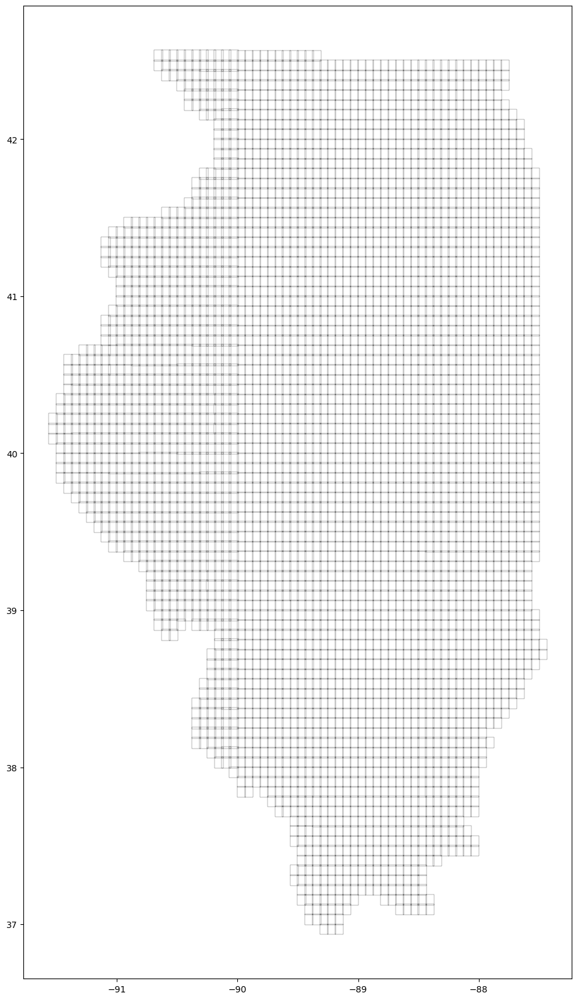

In [92]:
fig_width = 20
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
gdf.plot(facecolor="none", linewidth=fig_width*0.01, ax=ax)